# Packages setup and imports

In [ ]:
!pip install pandas
!pip install nltk
!pip install langdetect
!pip install gensim
!pip install matplotlib
!pip install wordcloud
!pip install pywsd
!pip install scikit-learn
!pip install tmtoolkit
!pip install pyLDAvis

In [1]:
import csv
import gensim
import glob
import itertools
from matplotlib import pyplot as plt
import matplotlib.colors as mcolors
import math
import operator 
import os
import pandas as pd
import string
import re
from wordcloud import WordCloud, STOPWORDS
import numpy as np

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

import langdetect
from langdetect import detect

from tokenize import tokenize

import pywsd
from pywsd.utils import lemmatize_sentence

import tmtoolkit
from tmtoolkit.topicmod.evaluate import metric_coherence_gensim

Warming up PyWSD (takes ~10 secs)... took 3.0554263591766357 secs.


In [2]:
#pyLDAvis
import pyLDAvis
import pyLDAvis.lda_model
import warnings

warnings.filterwarnings('ignore')
%matplotlib inline

pyLDAvis.enable_notebook()

In [3]:
#NLTK packages
import nltk
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')  
nltk.download('omw-1.4')
nltk.download('averaged_perceptron_tagger')
from nltk.corpus import stopwords
from nltk.probability import MLEProbDist

# Define stop words
stop_words = stopwords.words('english')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Elina\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Elina\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Elina\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\Elina\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\Elina\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [4]:
# Set up the file paths and directory names
restaurant_reviews_csv = r"./scraped_data/TripAdvisor_restaurants_reviews.csv"
restaurant_reviews_cleaned_csv = r"./scraped_data/TripAdvisor_restaurants_reviews_cleaned.csv"
restaurant_info_csv = r"./scraped_data/TripAdvisor_restaurants.csv"
folder_name = "reviews"

# Preprocessing

Requires only to be ran once to obtain _TripAdvisor\_restaurants\_reviews\_cleaned.csv_ and to separate reviews into different files according to the restaurant type.

* Removing duplicate reviews and writing to new file;
* Processing reviews to identify which restaurant types are the most common in the scraped reviews;
* Separate reviews to the separate files based on the type of the restaurants and based on the customer satiscation.

In [5]:
def remove_duplicates_and_non_english_reviews(file_path, processed_file_path):
    columns = ["Restaurant name", "Author", "Date", "Review", "Rating"]
    data = pd.read_csv(file_path,names=columns)
    duplicateRowsDF = data[data['Review'].duplicated()]
    print("Found duplicates: " + str(len(duplicateRowsDF)) + ". Removing and writing to new file.")
    cleaned_df = data.drop_duplicates(subset="Review")
    cleaned_df = remove_non_english_reviews(cleaned_df)
    cleaned_df.to_csv(processed_file_path, columns=columns, index=False)

def remove_non_english_reviews(dataframe):
    rows_to_remove = []
    for i, df_row in dataframe.iterrows():
        language = ""
        try:
            language = detect(df_row["Review"])
        except:
            print("Language was not identified, skipping one review for the restaurant " + str(df_row["Restaurant name"]))
        if language != "en":
            rows_to_remove.append(i)
    dataframe = dataframe.drop(rows_to_remove)
    print("Removed " + str(len(rows_to_remove)) + " non-English reviews. Total number of reviews left: " + str(len(dataframe.index)))
    return dataframe

def get_dict_of_most_common_types_of_restaurants(file_path, k_top_keys = 5):
    with open(file_path, mode='r', newline='', encoding="utf-8") as restaurant_file:
        data_reader = csv.reader(restaurant_file, delimiter = ',', quotechar = '"', quoting = csv.QUOTE_MINIMAL)
        type_restaurant_dictionary = {}
        type_count_dictionary = {}
        for (restaurant_name, _, types) in data_reader:
            for ty in types.strip('][').split(', '):
                if ty: #Check string not null or empty
                    lower_case_type = ty.lower().replace("'", "").replace(" ", "_")
                    if lower_case_type: 
                        if lower_case_type not in type_restaurant_dictionary.keys():
                            type_restaurant_dictionary[lower_case_type] = [restaurant_name]
                            type_count_dictionary[lower_case_type] = 1
                        else:
                            type_restaurant_dictionary[lower_case_type].append(restaurant_name)
                            type_count_dictionary[lower_case_type] += 1
        sorted_type_count_dictionary = dict(sorted(type_count_dictionary.items(), key=operator.itemgetter(1), reverse=True))
        top_keys = list(sorted_type_count_dictionary.keys())[:k_top_keys]
        result_dictionary = {}
        for key in top_keys:
            result_dictionary[key] = type_restaurant_dictionary[key]
        return result_dictionary
    
def separate_reviews_to_files(reviews_filepath, type_restaurant_dictionary, folder_name):
    all_restaurants_values = [x for xs in list(itertools.chain(type_restaurant_dictionary.values())) for x in xs]
    with open(reviews_filepath, mode='r', newline='', encoding="utf-8") as restaurant_file:
        data_reader = csv.reader(restaurant_file, delimiter = ',', quotechar = '"', quoting = csv.QUOTE_MINIMAL)
        for (restaurant_name, author, date, review, rating) in data_reader:
            if restaurant_name in all_restaurants_values:
                keys_list = [k for k, v in type_restaurant_dictionary.items() if restaurant_name in v]
                for key in keys_list:
                    review = review.replace("\"", ""). replace("'", "")
                    if float(rating) > 3.0:
                        with open(fr"./{folder_name}/{key}_positive.csv", mode='a+', newline='', encoding="utf-8") as trip:
                            data_writer = csv.writer(trip, delimiter = ',', quotechar = '"', quoting = csv.QUOTE_MINIMAL)
                            data_writer.writerow([review])
                    elif float(rating) <= 3.0:
                        with open(fr"./{folder_name}/{key}_negative.csv", mode='a+', newline='', encoding="utf-8") as trip:
                            data_writer = csv.writer(trip, delimiter = ',', quotechar = '"', quoting = csv.QUOTE_MINIMAL)
                            data_writer.writerow([review])
                    else:
                        raise Exception('incorrect rating')

The following code removes duplicates and non-English reviews from the data. The code should only be executed once, as there is no need to run it more times and it is time consuming! The code creates new file which path is saved as _restaurant\_reviews\_cleaned\_csv_ variable.

In [6]:
# Only need to be run once on the entire data to clean duplicates
print("Process scraped reviews and replace reviews folder content.")
files_to_remove = glob.glob(f'./{folder_name}/*')
for f in files_to_remove:
    os.remove(f)
remove_duplicates_and_non_english_reviews(restaurant_reviews_csv, restaurant_reviews_cleaned_csv) 

Process scraped reviews and replace reviews folder content.
Found duplicates: 1707. Removing and writing to new file.
Language was not identified, skipping one review for the restaurant Kababjee
Language was not identified, skipping one review for the restaurant Beachclub 't Gorsje
Removed 7623 non-English reviews. Total number of reviews left: 16149


The following code find the most common restaurant types and creates multiple separate files that represent different restaurant types and thei positive/negative reviews. Positive review had rating 4 or 5, while negative is <=3. Variable _k\_top\_restaurant\_types_ can be changed to change the number of extracted restaurant types.

In [8]:
# Finding out what restaurant types are most common and returning dictionary {"restaurant type" : [list of restaurant names of the type]}
k_top_restaurant_types = 5
most_common_restaurants_dict = get_dict_of_most_common_types_of_restaurants(restaurant_info_csv, k_top_keys=k_top_restaurant_types) 
separate_reviews_to_files(restaurant_reviews_cleaned_csv, most_common_restaurants_dict, folder_name)
files_written = glob.glob(f'./{folder_name}/*')
print("The following files were saved: ")
for f in files_written:
    print(f)

The following files were saved: 
./reviews\dutch_negative.csv
./reviews\dutch_positive.csv
./reviews\european_negative.csv
./reviews\european_positive.csv
./reviews\italian_negative.csv
./reviews\italian_positive.csv
./reviews\seafood_negative.csv
./reviews\seafood_positive.csv
./reviews\vegetarian_friendly_negative.csv
./reviews\vegetarian_friendly_positive.csv


# Helper functions

In [6]:
def filepath_to_string(file_path):
    path_and_name = file_path.rsplit('\\', 1)
    if len(path_and_name) == 2:
        file_name = path_and_name[1].rsplit('.', 1)[0]
        type_rating_split = file_name.rsplit('_', 1)
        if len(type_rating_split) == 2:
            return type_rating_split[0].replace("_", " ").capitalize() + " (" + type_rating_split[1] + ")"
        else:
            raise Exception('incorrect filepath')
    else:
        raise Exception('incorrect filepath')

In [7]:
stop_words.extend(["restaurant", "a", "the", "and", "or"])

def tokenize_all_reviews(reviews):
    all_tokens = []
    for review_list in reviews:
        tokens = [word for word in review_list if word not in stop_words]
        tokens = [word for word in tokens if word not in string.punctuation]
        tokens = [word for word in tokens if word.isalpha()]
        all_tokens.extend(tokens)
    return all_tokens

In [8]:
wpt = nltk.WordPunctTokenizer()

def normalize_document(doc):
    # lower case and remove special characters\whitespaces
    doc = re.sub(r'[^a-zA-Z0-9\s]', '', doc, re.I | re.A)
    doc = doc.lower()
    doc = doc.strip()
    # tokeanize document
    tokens = wpt.tokenize(doc)
    # filter stopwords out of document
    filtered_tokens = [token for token in tokens if token not in stop_words]
    # re-create document from filtered tokens
    doc = ' '.join(filtered_tokens)
    return doc

In [9]:
def reviews_ngrams(reviews, n):
    all_tokens = tokenize_all_reviews(reviews)
    bgs = nltk.ngrams(all_tokens, n)
    return nltk.FreqDist(bgs)

In [10]:
def authors_ngrams(authors, n):
    all_tokens = []
    for author in authors:
        tokens = nltk.tokenize.sent_tokenize(author)
        all_tokens.extend(tokens)
    
    bgs = nltk.ngrams(all_tokens, n)
    return nltk.FreqDist(bgs)

In [11]:
def plot_dist_as_cloud(reviews_ngrams, n, max_words):
    prob_dist = MLEProbDist(reviews_ngrams)
    visualisation_dict = {}
    for word_freq_tuple in reviews_ngrams:
        string = ' '.join(word_freq_tuple)
        visualisation_dict[string] = prob_dist.prob(word_freq_tuple)
    cloud = WordCloud(width=1000, height=500, max_words=max_words).generate_from_frequencies(visualisation_dict)
  
    plt.figure(figsize = (30,30))
    plt.imshow(cloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()
    print(f"Wordcloud for {n}-grams with the set max_words argument to {max_words}.")

In [12]:
def print_and_plot_ngrams(reviews_ngrams, n, plot_cloud=True):
    print(f'Found {len(reviews_ngrams)} {n}-grams. Most common 25 {n}-grams:')
    most_common_ngrams = reviews_ngrams.most_common(25)
    for word_freq_tuple in most_common_ngrams:
      print(word_freq_tuple)
    if plot_cloud:
        plot_dist_as_cloud(reviews_ngrams, n, 50)

# Data exploration

In [15]:
# Load data for exploration
columns = ["Restaurant name", "Author", "Date", "Review", "Rating"]
data = pd.read_csv(restaurant_reviews_cleaned_csv,names=columns)
data["Review"] = data["Review"].map(lambda x: lemmatize_sentence(x))

KeyboardInterrupt: 

In [ ]:
# Show authors that posted the most reviews on the restaurants.
n = 1 
most_frequent_authors = authors_ngrams(data["Author"], n)
print_and_plot_ngrams(most_frequent_authors, n, False)

Found 16979 1-grams. Most common 25 1-grams:
(('food',), 8736)
(('good',), 8370)
(('service',), 5111)
(('nice',), 5077)
(('place',), 4539)
(('great',), 4500)
(('friendly',), 3698)
(('staff',), 3314)
(('go',), 3172)
(('menu',), 3154)
(('time',), 2758)
(('visit',), 2377)
(('dish',), 2292)
(('well',), 2186)
(('dinner',), 2179)
(('excellent',), 2111)
(('one',), 2110)
(('really',), 2090)
(('eat',), 2010)
(('come',), 1998)
(('also',), 1996)
(('price',), 1963)
(('order',), 1873)
(('wine',), 1872)
(('make',), 1852)


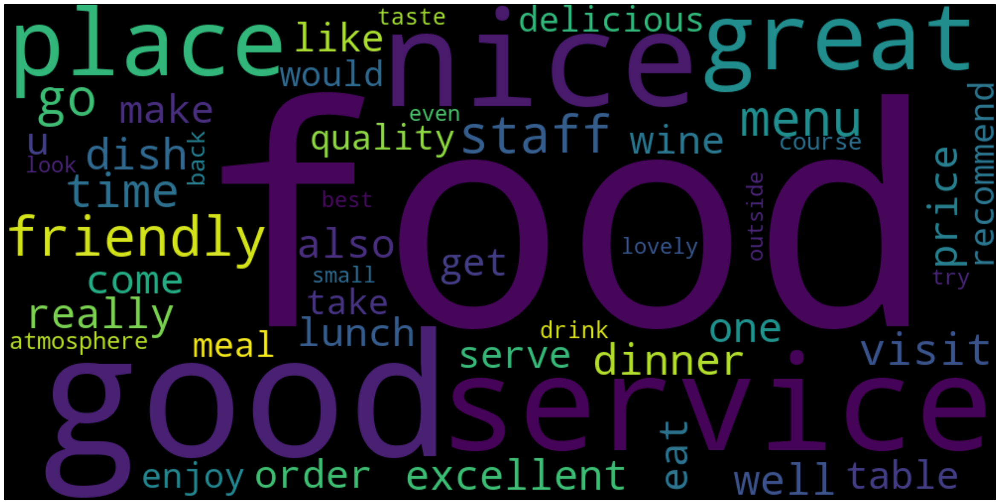

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [14]:
n = 1 
all_ngrams_frequencies = reviews_ngrams(data["Review"][1:], n)
print_and_plot_ngrams(all_ngrams_frequencies, n)
for review in data["Review"][1:]:
    print(review)

Found 209051 2-grams. Most common 25 2-grams:
(('food', 'good'), 796)
(('good', 'food'), 772)
(('friendly', 'staff'), 621)
(('staff', 'friendly'), 613)
(('good', 'service'), 537)
(('come', 'back'), 452)
(('service', 'good'), 448)
(('friendly', 'service'), 411)
(('great', 'food'), 400)
(('ice', 'cream'), 366)
(('food', 'great'), 364)
(('service', 'friendly'), 363)
(('nice', 'place'), 362)
(('really', 'good'), 340)
(('go', 'back'), 333)
(('quality', 'food'), 331)
(('main', 'course'), 321)
(('great', 'place'), 315)
(('highly', 'recommend'), 313)
(('food', 'excellent'), 296)
(('good', 'quality'), 294)
(('great', 'service'), 285)
(('sit', 'outside'), 263)
(('reasonable', 'price'), 259)
(('really', 'nice'), 255)


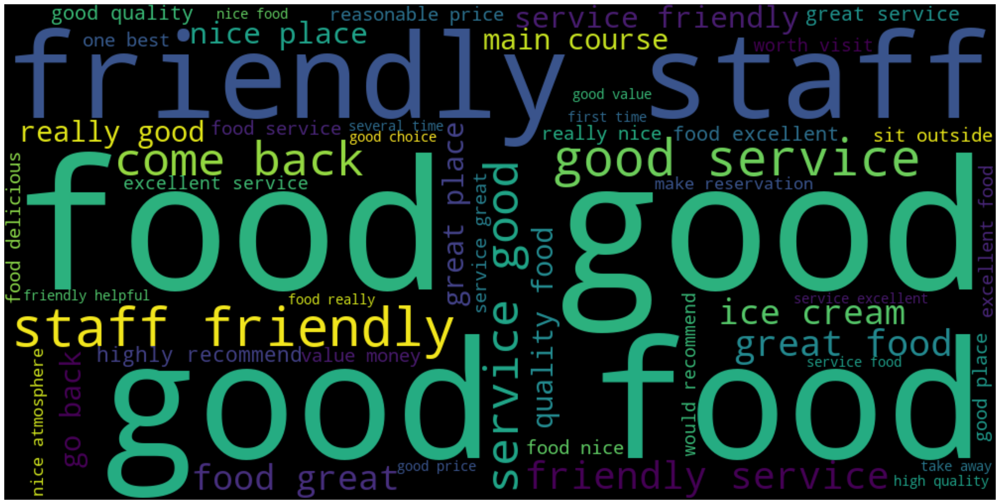

Wordcloud for 2-grams with the set max_words argument to 50.


In [15]:
n = 2 
all_ngrams_frequencies = reviews_ngrams(data["Review"], n)
print_and_plot_ngrams(all_ngrams_frequencies, n)

0                                                 [review]
1        [good, a, la, carte, food, ,, it, have, a, des...
2        [dinner, with, family, on, a, saturday, evenin...
3        [we, have, a, great, french, fry, and, kip, sa...
4        [the, food, be, excellent, and, the, people, v...
                               ...                        
16145    [friendly, service, i, have, a, dish, plaice, ...
16146    [thai, flavour, be, a, small, and, cosy, resta...
16147    [during, my, holiday, in, a, corona, infest, h...
16148    [i, visit, midweek, with, colleague, to, this,...
16149    [at, the, end, of, a, ``, car, '', holiday, ,,...
Name: Review, Length: 16150, dtype: object
Found 357452 3-grams. Most common 25 3-grams:
(('food', 'good', 'service'), 110)
(('good', 'value', 'money'), 88)
(('service', 'good', 'food'), 83)
(('van', 'der', 'valk'), 79)
(('good', 'food', 'good'), 72)
(('staff', 'friendly', 'helpful'), 71)
(('would', 'definitely', 'recommend'), 68)
(('friendly', 'sta

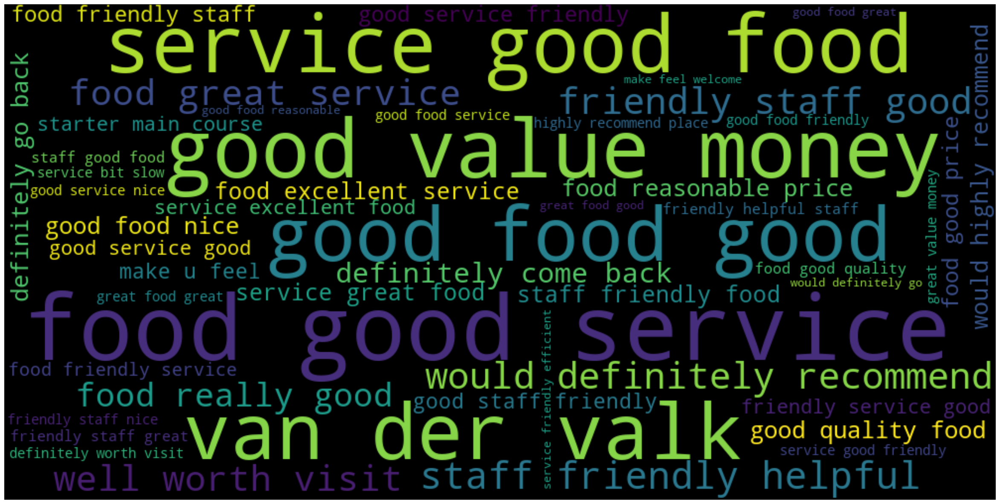

Wordcloud for 3-grams with the set max_words argument to 50.


In [20]:
n = 3 
all_ngrams_frequencies = reviews_ngrams(data["Review"], n)
print_and_plot_ngrams(all_ngrams_frequencies, n)

----------------------------------------------------------------------------------------
Below we show n-grams frequencies and wordcloud for Dutch (negative)
Found 51709 3-grams. Most common 25 3-grams:
(('van', 'der', 'valk'), 24)
(('starter', 'main', 'course'), 12)
(('food', 'good', 'service'), 12)
(('service', 'bit', 'slow'), 11)
(('never', 'come', 'back'), 9)
(('take', 'long', 'time'), 9)
(('good', 'service', 'friendly'), 8)
(('wait', 'long', 'time'), 8)
(('come', 'take', 'order'), 8)
(('food', 'reasonable', 'price'), 7)
(('food', 'nothing', 'special'), 7)
(('never', 'go', 'back'), 7)
(('staff', 'friendly', 'food'), 7)
(('good', 'place', 'go'), 6)
(('wait', 'half', 'hour'), 6)
(('good', 'food', 'nice'), 6)
(('place', 'look', 'nice'), 6)
(('glass', 'tap', 'water'), 5)
(('waitress', 'tell', 'u'), 5)
(('would', 'come', 'back'), 5)
(('make', 'u', 'feel'), 5)
(('place', 'really', 'nice'), 5)
(('poor', 'quality', 'food'), 5)
(('three', 'point', 'rating'), 5)
(('good', 'staff', 'friendly'

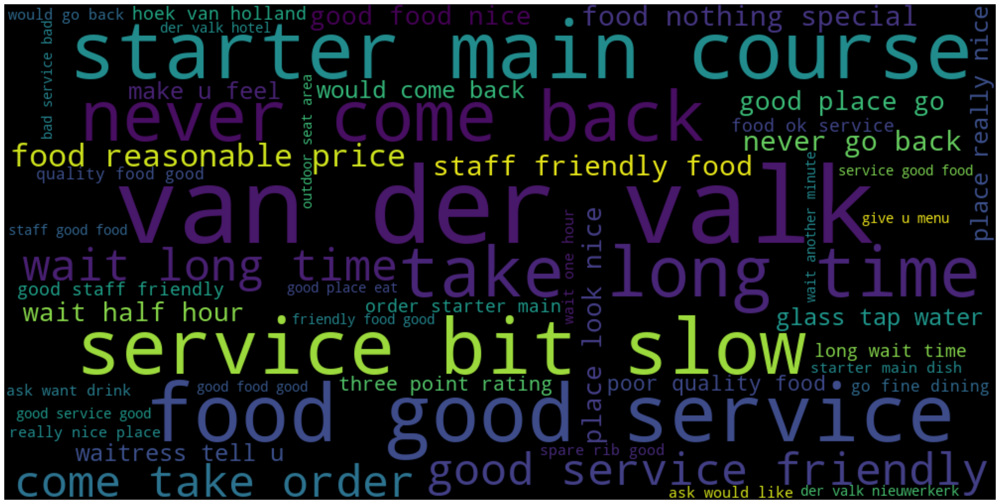

Wordcloud for 3-grams with the set max_words argument to 50.
----------------------------------------------------------------------------------------
Below we show n-grams frequencies and wordcloud for Dutch (positive)
Found 183934 3-grams. Most common 25 3-grams:
(('service', 'good', 'food'), 60)
(('food', 'good', 'service'), 60)
(('good', 'value', 'money'), 54)
(('well', 'worth', 'visit'), 53)
(('van', 'der', 'valk'), 49)
(('good', 'food', 'good'), 47)
(('friendly', 'staff', 'good'), 44)
(('staff', 'friendly', 'helpful'), 40)
(('good', 'food', 'nice'), 39)
(('would', 'definitely', 'recommend'), 36)
(('definitely', 'go', 'back'), 36)
(('food', 'reasonable', 'price'), 33)
(('food', 'great', 'service'), 33)
(('would', 'highly', 'recommend'), 31)
(('good', 'quality', 'food'), 31)
(('good', 'staff', 'friendly'), 30)
(('food', 'really', 'good'), 29)
(('food', 'friendly', 'staff'), 28)
(('definitely', 'come', 'back'), 28)
(('friendly', 'helpful', 'staff'), 28)
(('service', 'great', 'food'),

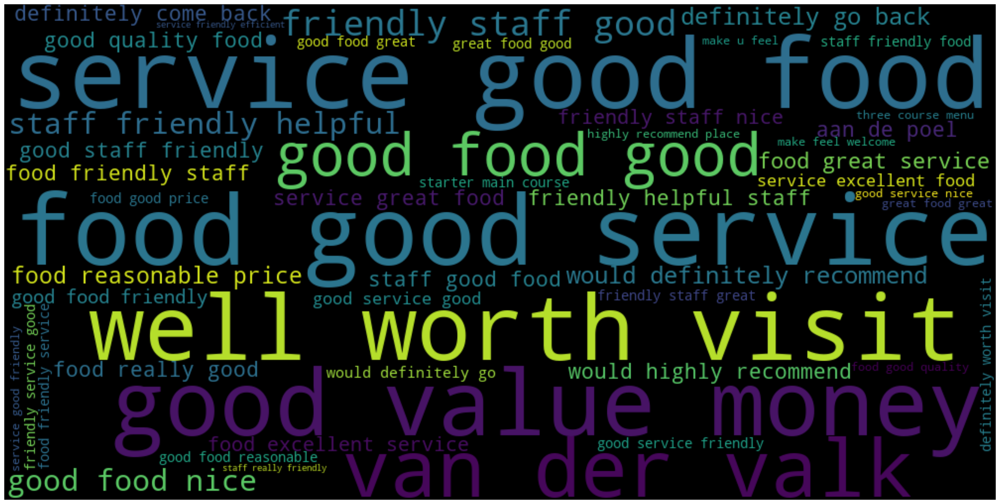

Wordcloud for 3-grams with the set max_words argument to 50.
----------------------------------------------------------------------------------------
Below we show n-grams frequencies and wordcloud for European (negative)
Found 42053 3-grams. Most common 25 3-grams:
(('van', 'der', 'valk'), 22)
(('food', 'good', 'service'), 11)
(('starter', 'main', 'course'), 8)
(('never', 'come', 'back'), 8)
(('service', 'bit', 'slow'), 8)
(('staff', 'friendly', 'food'), 7)
(('food', 'reasonable', 'price'), 6)
(('never', 'go', 'back'), 6)
(('wait', 'half', 'hour'), 6)
(('good', 'service', 'friendly'), 6)
(('good', 'food', 'nice'), 6)
(('long', 'wait', 'time'), 6)
(('glass', 'tap', 'water'), 5)
(('good', 'place', 'go'), 5)
(('food', 'well', 'prepared'), 5)
(('food', 'average', 'service'), 5)
(('take', 'long', 'time'), 5)
(('come', 'take', 'order'), 5)
(('friendly', 'food', 'good'), 5)
(('food', 'good', 'price'), 5)
(('nice', 'staff', 'friendly'), 5)
(('wait', 'hour', 'food'), 5)
(('hoek', 'van', 'holla

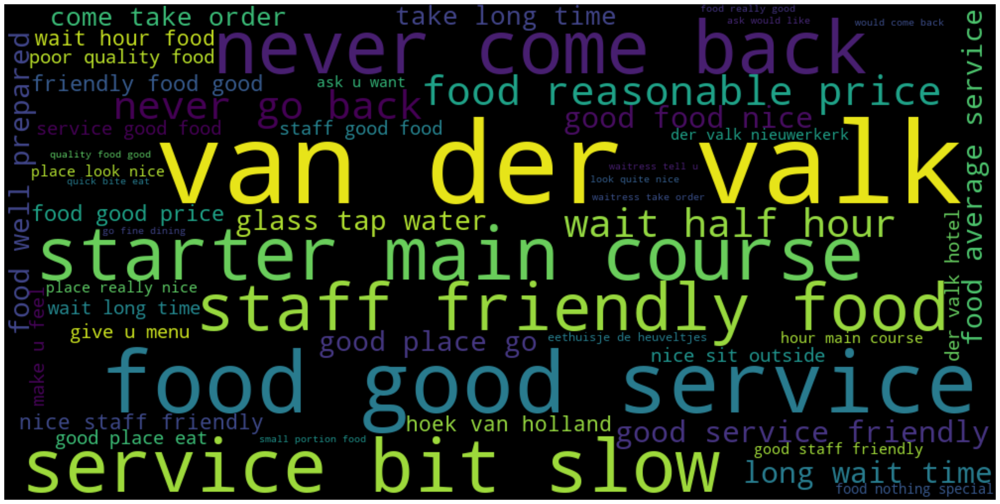

Wordcloud for 3-grams with the set max_words argument to 50.
----------------------------------------------------------------------------------------
Below we show n-grams frequencies and wordcloud for European (positive)
Found 142157 3-grams. Most common 25 3-grams:
(('food', 'good', 'service'), 48)
(('good', 'value', 'money'), 47)
(('service', 'good', 'food'), 46)
(('van', 'der', 'valk'), 43)
(('good', 'food', 'good'), 41)
(('well', 'worth', 'visit'), 39)
(('friendly', 'staff', 'good'), 37)
(('would', 'definitely', 'recommend'), 32)
(('food', 'great', 'service'), 32)
(('good', 'quality', 'food'), 30)
(('good', 'food', 'nice'), 30)
(('staff', 'friendly', 'helpful'), 29)
(('service', 'excellent', 'food'), 28)
(('food', 'really', 'good'), 28)
(('service', 'great', 'food'), 26)
(('food', 'reasonable', 'price'), 24)
(('definitely', 'go', 'back'), 24)
(('food', 'good', 'price'), 23)
(('would', 'highly', 'recommend'), 22)
(('good', 'staff', 'friendly'), 22)
(('food', 'excellent', 'service')

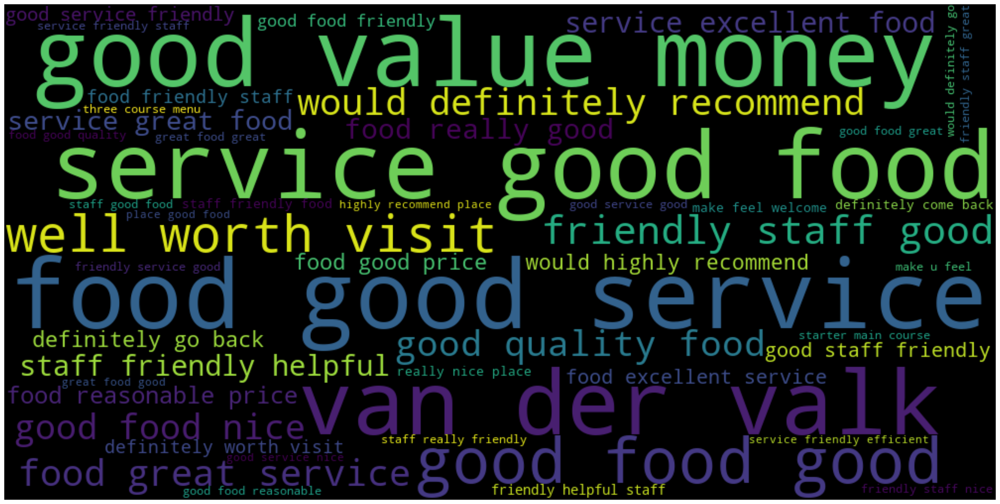

Wordcloud for 3-grams with the set max_words argument to 50.
----------------------------------------------------------------------------------------
Below we show n-grams frequencies and wordcloud for Italian (negative)
Found 6693 3-grams. Most common 25 3-grams:
(('never', 'come', 'back'), 4)
(('food', 'good', 'service'), 4)
(('take', 'away', 'pizza'), 3)
(('spicy', 'olive', 'oil'), 3)
(('want', 'try', 'something'), 2)
(('friendly', 'pizza', 'good'), 2)
(('never', 'go', 'back'), 2)
(('glass', 'tap', 'water'), 2)
(('make', 'good', 'pizza'), 2)
(('italian', 'staff', 'friendly'), 2)
(('friendly', 'service', 'good'), 2)
(('take', 'long', 'time'), 2)
(('come', 'table', 'ask'), 2)
(('give', 'another', 'try'), 2)
(('italian', 'pizza', 'go'), 2)
(('food', 'average', 'service'), 2)
(('food', 'take', 'hour'), 2)
(('main', 'course', 'arrive'), 2)
(('another', 'long', 'wait'), 2)
(('soup', 'four', 'cheese'), 2)
(('four', 'cheese', 'pizza'), 2)
(('pizza', 'taste', 'like'), 2)
(('order', 'pizza', 

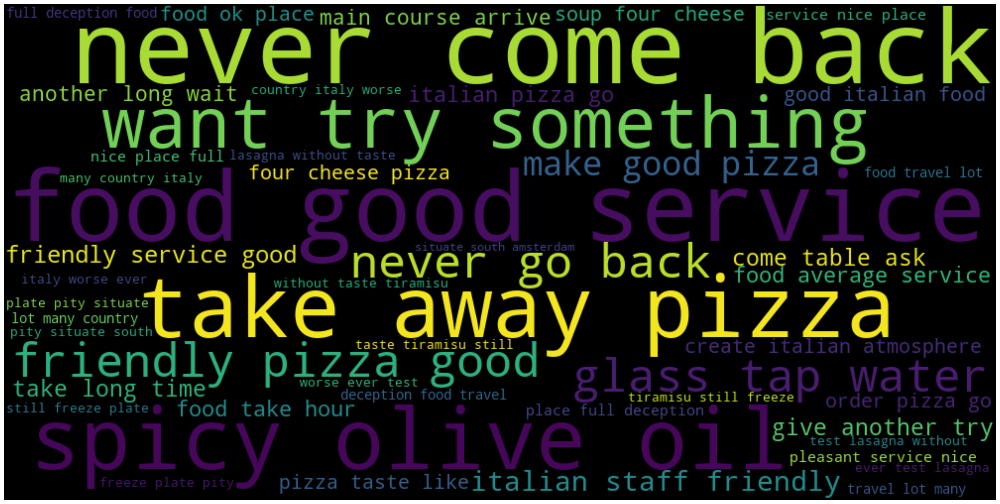

Wordcloud for 3-grams with the set max_words argument to 50.
----------------------------------------------------------------------------------------
Below we show n-grams frequencies and wordcloud for Italian (positive)
Found 20067 3-grams. Most common 25 3-grams:
(('good', 'italian', 'food'), 13)
(('would', 'definitely', 'recommend'), 9)
(('italian', 'food', 'great'), 9)
(('authentic', 'italian', 'food'), 8)
(('food', 'good', 'service'), 7)
(('great', 'italian', 'food'), 7)
(('good', 'service', 'friendly'), 6)
(('real', 'italian', 'food'), 6)
(('sure', 'make', 'reservation'), 6)
(('food', 'great', 'service'), 6)
(('tutta', 'la', 'vita'), 6)
(('staff', 'friendly', 'helpful'), 5)
(('nice', 'atmosphere', 'friendly'), 5)
(('great', 'food', 'delicious'), 5)
(('best', 'italian', 'food'), 5)
(('food', 'really', 'good'), 5)
(('best', 'pizza', 'ever'), 5)
(('friendly', 'staff', 'good'), 5)
(('food', 'excellent', 'service'), 5)
(('good', 'food', 'good'), 5)
(('margherita', 'tutta', 'la'), 5)
(

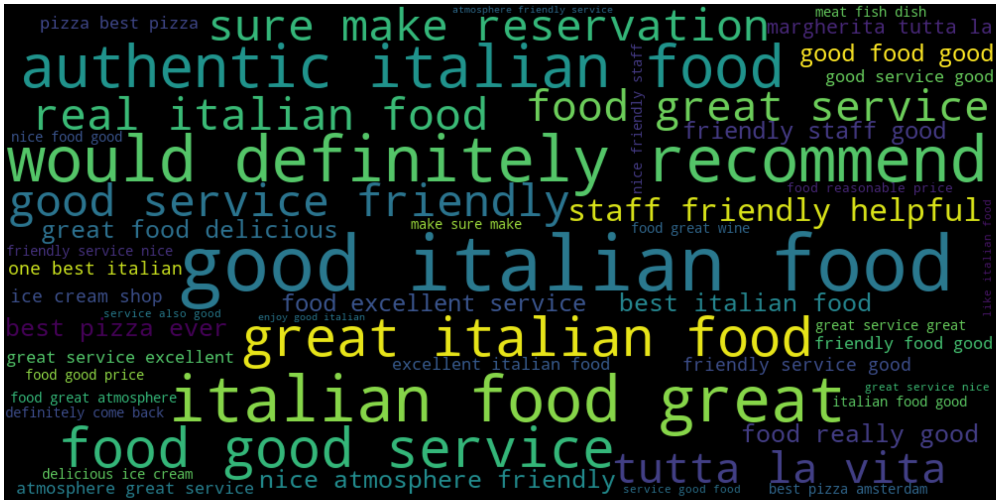

Wordcloud for 3-grams with the set max_words argument to 50.
----------------------------------------------------------------------------------------
Below we show n-grams frequencies and wordcloud for Seafood (negative)
Found 39186 3-grams. Most common 25 3-grams:
(('van', 'der', 'valk'), 22)
(('never', 'come', 'back'), 12)
(('take', 'long', 'time'), 8)
(('service', 'bit', 'slow'), 8)
(('starter', 'main', 'course'), 8)
(('wait', 'long', 'time'), 7)
(('never', 'go', 'back'), 7)
(('food', 'reasonable', 'price'), 7)
(('ok', 'nothing', 'special'), 7)
(('food', 'good', 'service'), 7)
(('food', 'ok', 'nothing'), 5)
(('wont', 'go', 'back'), 5)
(('nice', 'staff', 'friendly'), 5)
(('staff', 'friendly', 'food'), 5)
(('good', 'service', 'friendly'), 5)
(('good', 'food', 'nice'), 5)
(('make', 'u', 'feel'), 5)
(('order', 'starter', 'main'), 5)
(('hoek', 'van', 'holland'), 5)
(('good', 'place', 'eat'), 4)
(('food', 'ok', 'service'), 4)
(('food', 'pretty', 'good'), 4)
(('food', 'bad', 'service'), 4)

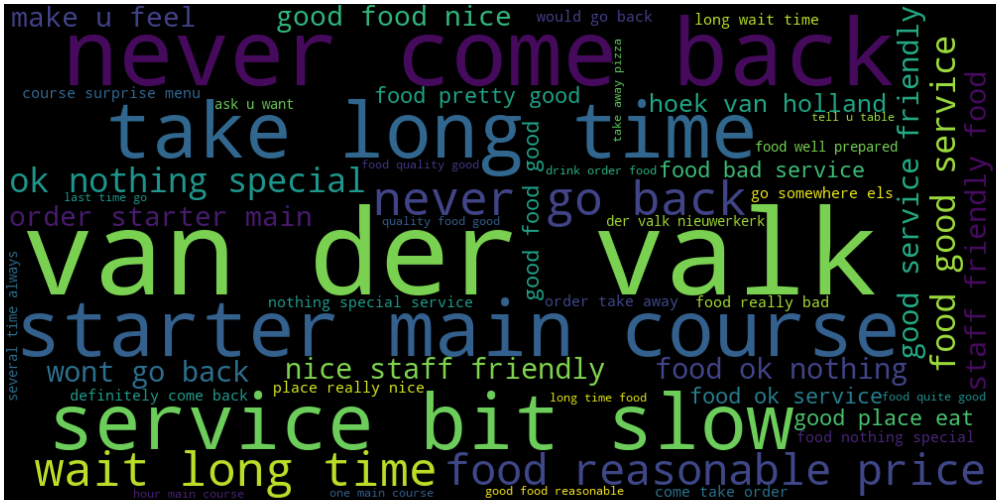

Wordcloud for 3-grams with the set max_words argument to 50.
----------------------------------------------------------------------------------------
Below we show n-grams frequencies and wordcloud for Seafood (positive)
Found 150808 3-grams. Most common 25 3-grams:
(('food', 'good', 'service'), 49)
(('good', 'value', 'money'), 49)
(('van', 'der', 'valk'), 48)
(('service', 'good', 'food'), 45)
(('staff', 'friendly', 'helpful'), 35)
(('definitely', 'come', 'back'), 34)
(('definitely', 'go', 'back'), 33)
(('food', 'really', 'good'), 33)
(('would', 'definitely', 'recommend'), 32)
(('food', 'great', 'service'), 32)
(('good', 'food', 'good'), 32)
(('friendly', 'staff', 'good'), 31)
(('good', 'quality', 'food'), 29)
(('food', 'reasonable', 'price'), 29)
(('well', 'worth', 'visit'), 29)
(('good', 'service', 'good'), 27)
(('food', 'excellent', 'service'), 27)
(('food', 'friendly', 'staff'), 26)
(('good', 'food', 'nice'), 26)
(('aan', 'de', 'poel'), 26)
(('service', 'great', 'food'), 25)
(('foo

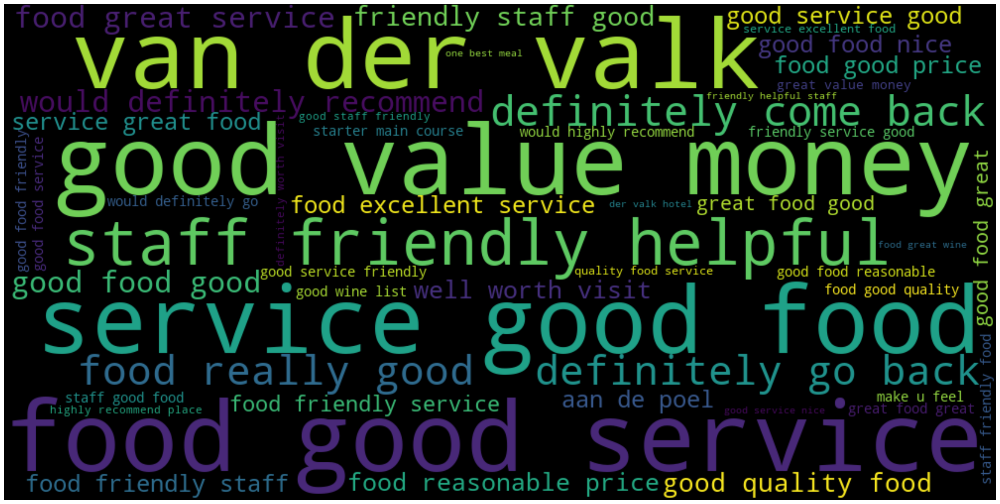

Wordcloud for 3-grams with the set max_words argument to 50.
----------------------------------------------------------------------------------------
Below we show n-grams frequencies and wordcloud for Vegetarian friendly (negative)
Found 16330 3-grams. Most common 25 3-grams:
(('good', 'place', 'go'), 6)
(('food', 'good', 'service'), 5)
(('come', 'take', 'order'), 4)
(('eethuisje', 'de', 'heuveltjes'), 4)
(('never', 'go', 'back'), 3)
(('waitress', 'tell', 'u'), 3)
(('tom', 'ka', 'gai'), 3)
(('good', 'service', 'friendly'), 3)
(('good', 'place', 'eat'), 3)
(('food', 'nothing', 'special'), 3)
(('service', 'bit', 'slow'), 3)
(('staff', 'friendly', 'food'), 3)
(('ok', 'nothing', 'special'), 3)
(('good', 'food', 'nice'), 3)
(('food', 'ok', 'nothing'), 3)
(('food', 'quality', 'good'), 2)
(('first', 'time', 'visit'), 2)
(('table', 'door', 'family'), 2)
(('tell', 'u', 'could'), 2)
(('food', 'wasnt', 'bad'), 2)
(('nothing', 'write', 'home'), 2)
(('place', 'pack', 'people'), 2)
(('pancake', 'gr

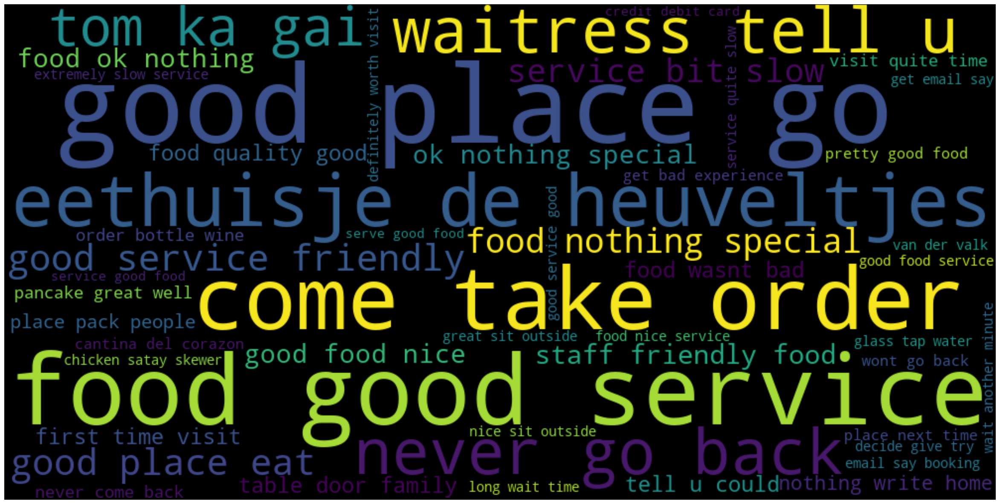

Wordcloud for 3-grams with the set max_words argument to 50.
----------------------------------------------------------------------------------------
Below we show n-grams frequencies and wordcloud for Vegetarian friendly (positive)
Found 61598 3-grams. Most common 25 3-grams:
(('friendly', 'staff', 'good'), 20)
(('staff', 'friendly', 'helpful'), 18)
(('good', 'value', 'money'), 17)
(('food', 'good', 'service'), 16)
(('good', 'food', 'good'), 14)
(('good', 'quality', 'food'), 13)
(('would', 'highly', 'recommend'), 13)
(('definitely', 'go', 'back'), 13)
(('food', 'friendly', 'staff'), 12)
(('best', 'ice', 'cream'), 11)
(('staff', 'friendly', 'food'), 11)
(('staff', 'good', 'food'), 10)
(('definitely', 'worth', 'visit'), 10)
(('food', 'great', 'service'), 10)
(('friendly', 'staff', 'great'), 10)
(('friendly', 'staff', 'nice'), 10)
(('service', 'excellent', 'food'), 10)
(('great', 'value', 'money'), 9)
(('food', 'friendly', 'service'), 9)
(('good', 'staff', 'friendly'), 9)
(('friendly', '

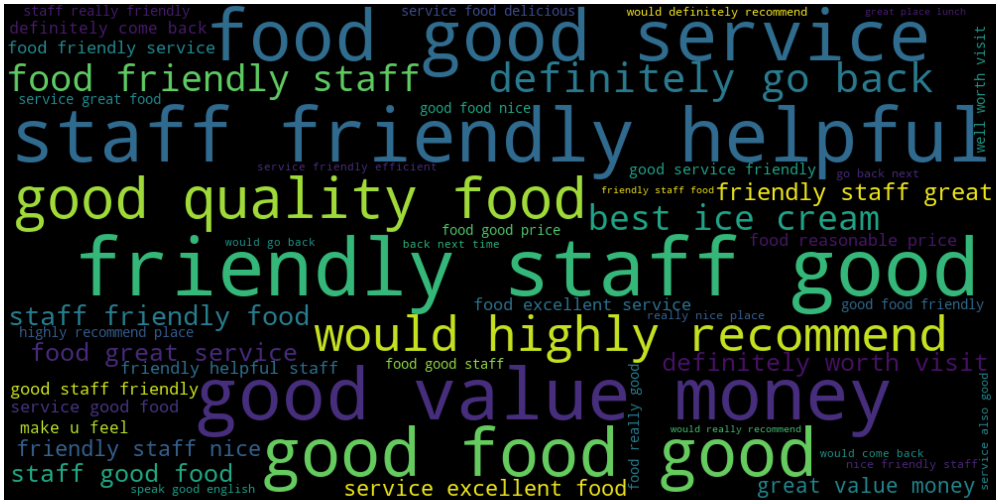

Wordcloud for 3-grams with the set max_words argument to 50.


In [22]:
n = 3
review_by_restaurant_type = glob.glob(f'./{folder_name}/*')
for f in review_by_restaurant_type:
    print("----------------------------------------------------------------------------------------")
    print("Below we show n-grams frequencies and wordcloud for " + filepath_to_string(f))
    columns = ["Review"]
    file_data = pd.read_csv(f, names=columns) 
    file_data["Review"] = file_data["Review"].map(lambda x: lemmatize_sentence(x))
    all_ngrams_frequencies = reviews_ngrams(file_data["Review"], n)
    print_and_plot_ngrams(all_ngrams_frequencies, n)

# Topic modelling

In [13]:
max_iterations = 10
random_state = 42

## Topic modelling helper functions

In [14]:
def process_reviews_into_dictionary_and_corpus(reviews_ngram_data, n):
    if n > 1:
        reviews_ngram_data = [("_".join(reviews_tuple),) for reviews_tuple in reviews_ngram_data]
        dictionary = corpora.Dictionary(reviews_ngram_data)
        doc_term_matrix = [dictionary.doc2bow(doc) for doc in reviews_ngram_data]
    elif n == 1:
        dictionary = corpora.Dictionary(reviews_ngram_data)
        doc_term_matrix = [dictionary.doc2bow(doc) for doc in reviews_ngram_data]
    else:
        raise Exception('n should be positive integer')
    return dictionary, doc_term_matrix

In [21]:
def topic_modelling_visualisation(top_n, topics_dicts, file_name, enumeration):
    cols = [color for _, color in mcolors.TABLEAU_COLORS.items()]
    cloud = WordCloud(background_color='white',
                  width=2500,
                  height=1800,
                  max_words=top_n,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)

    
    fig, axs = plt.subplots(2,math.ceil(len(topics_dicts)/2), figsize=(15,10))
    axs = axs.ravel()
    for i in range(len(topics_dicts)):
        cloud.generate_from_frequencies(topics_dicts[i], max_font_size=300)
        axs[i].imshow(cloud)
        axs[i].set_title('Topic ' + str(i), fontdict=dict(size=16))
        axs[i].axis('off')
    plt.margins(x=0, y=0)
    plt.tight_layout()
    plt.show()
    print(f"Figure {enumeration}: Topic modelling for file {filepath_to_string(file_name)}\n")

In [16]:


# Code source: https://alvinntnu.github.io/NTNU_ENC2045_LECTURES/nlp/topic-modeling-naive.html#topic=0&lambda=1&term=

def topic_model_coherence_generator(topic_num_start=2,
                                    topic_num_end=6,
                                    norm_corpus='',
                                    cv_matrix='',
                                    cv='',
                                    max_iter = 10):
    norm_corpus_tokens = [doc.split() for doc in norm_corpus]
    models = []
    coherence_scores = []

    for i in range(topic_num_start, topic_num_end):
        # print(i)
        cur_lda = LatentDirichletAllocation(n_components=i,
                                            max_iter=max_iter,
                                            random_state=random_state)
        cur_lda.fit_transform(cv_matrix)
        cur_coherence_score = metric_coherence_gensim(
            measure='c_v',
            top_n=5,
            topic_word_distrib=cur_lda.components_,
            dtm=cv.fit_transform(norm_corpus),
            vocab=np.array(cv.get_feature_names_out()),
            texts=norm_corpus_tokens)
        models.append(cur_lda)
        coherence_scores.append(np.mean(cur_coherence_score))
    return models, coherence_scores

In [17]:
# Code source: https://alvinntnu.github.io/NTNU_ENC2045_LECTURES/nlp/topic-modeling-naive.html#topic=0&lambda=1&term=

def get_topics_meanings(tw_m,
                        vocab,
                        display_weights=False,
                        topn=5,
                        weight_cutoff=0.6):
    for i, topic_weights in enumerate(tw_m):  ## for each topic row
        topic = [(token, np.round(weight, 2))
                 for token, weight in zip(vocab, topic_weights)
                 ]  ## zip (word, importance_weight)
        topic = sorted(topic,
                       key=lambda x: -x[1])  ## rank words according to weights
        if display_weights:
            topic = [item for item in topic if item[1] > weight_cutoff
                     ]  ## output words whose weights > 0.6
            print(f"Topic #{i} :\n{topic}")
            print("=" * 20)
        else:
            topic_topn = topic[:topn]
            topic_topn = ' '.join([word for word, weight in topic_topn])
            print(f"Topic #{i} :\n{topic_topn}")
            print('=' * 20)

## Fine-tuning topic modelling

-----------------------------------------------------------------------
Fine-tuning topic number for Dutch (negative).


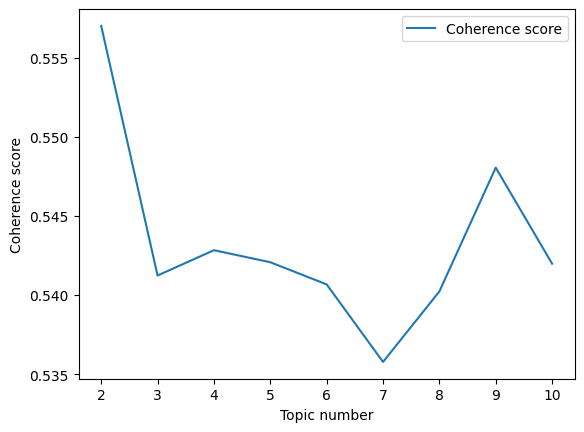

Figure: Plot of coherence scores for different topic numbers. Max coherence score 0.5570 at 2 topics.
-----------------------------------------------------------------------
Fine-tuning topic number for Dutch (positive).


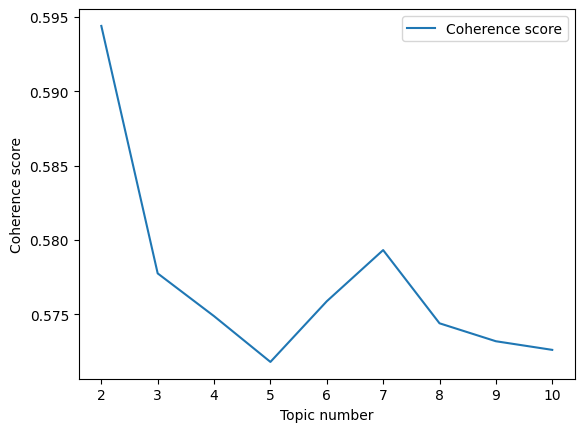

Figure: Plot of coherence scores for different topic numbers. Max coherence score 0.5944 at 2 topics.
-----------------------------------------------------------------------
Fine-tuning topic number for European (negative).


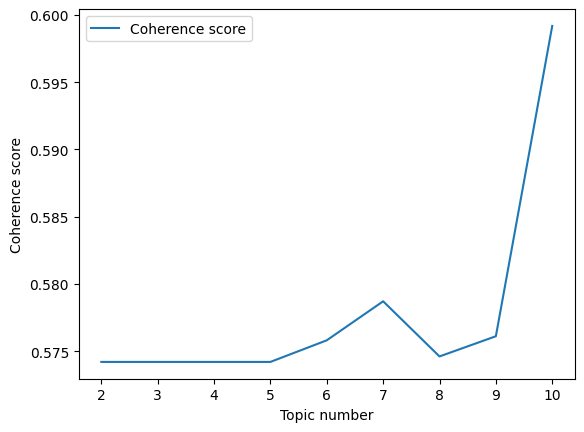

Figure: Plot of coherence scores for different topic numbers. Max coherence score 0.5992 at 10 topics.
-----------------------------------------------------------------------
Fine-tuning topic number for European (positive).


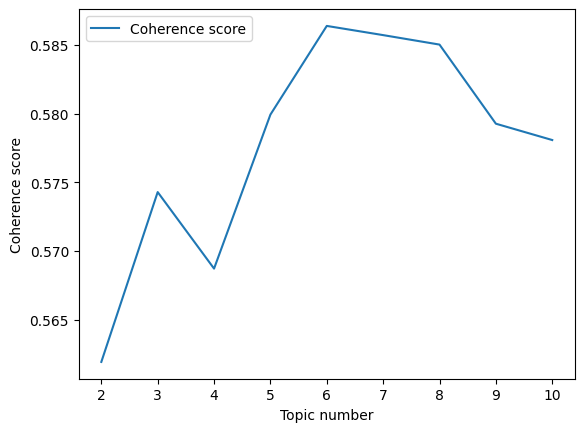

Figure: Plot of coherence scores for different topic numbers. Max coherence score 0.5864 at 6 topics.
-----------------------------------------------------------------------
Fine-tuning topic number for Italian (negative).


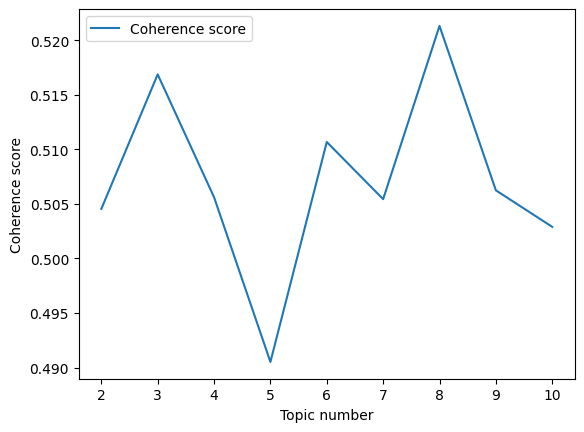

Figure: Plot of coherence scores for different topic numbers. Max coherence score 0.5213 at 8 topics.
-----------------------------------------------------------------------
Fine-tuning topic number for Italian (positive).


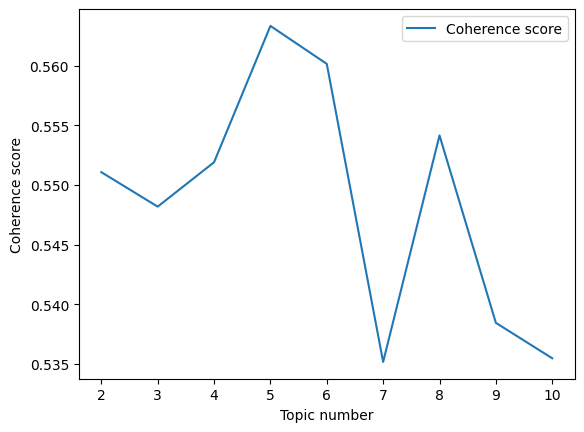

Figure: Plot of coherence scores for different topic numbers. Max coherence score 0.5633 at 5 topics.
-----------------------------------------------------------------------
Fine-tuning topic number for Seafood (negative).


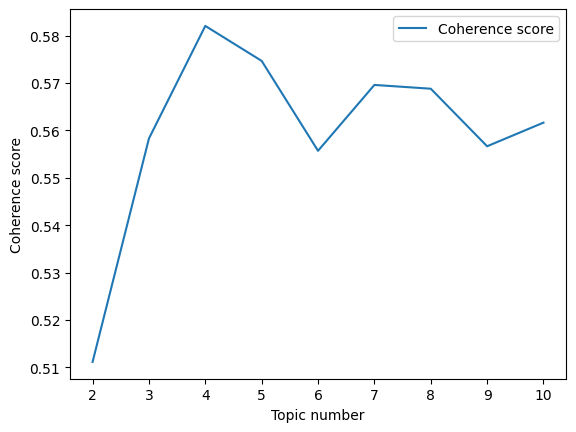

Figure: Plot of coherence scores for different topic numbers. Max coherence score 0.5820 at 4 topics.
-----------------------------------------------------------------------
Fine-tuning topic number for Seafood (positive).


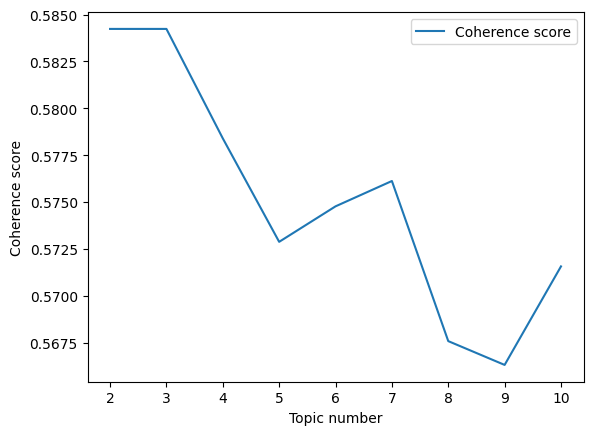

Figure: Plot of coherence scores for different topic numbers. Max coherence score 0.5842 at 2 topics.
-----------------------------------------------------------------------
Fine-tuning topic number for Vegetarian friendly (negative).


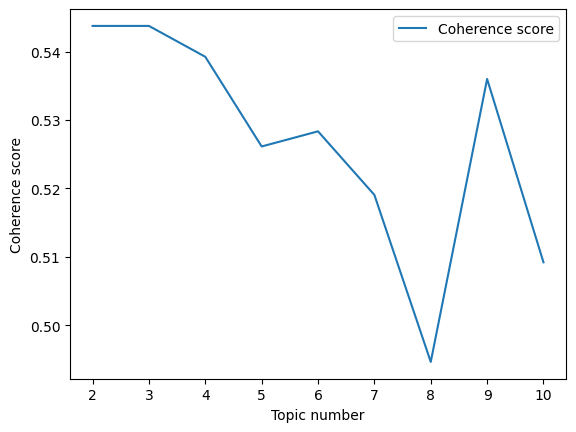

Figure: Plot of coherence scores for different topic numbers. Max coherence score 0.5437 at 2 topics.
-----------------------------------------------------------------------
Fine-tuning topic number for Vegetarian friendly (positive).


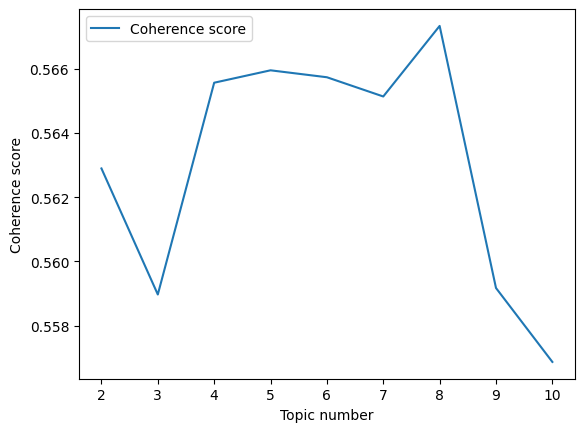

Figure: Plot of coherence scores for different topic numbers. Max coherence score 0.5673 at 8 topics.
CPU times: total: 47min 18s
Wall time: 1h 24min 56s


In [18]:
%%time

new_files = glob.glob(f'./{folder_name}/*')

# n for n-grams and number of LDA topics
n = 1
num_topics = 10

best_model_for_filepath = {}
best_topic_nr_for_filepath = {}

for i, file_path in enumerate(new_files):
    # Read reviews from file and normalise the corpus
    review_col_name = "Review"
    reviews_df = pd.read_csv(file_path, names=[review_col_name])
    normalize_corpus = np.vectorize(normalize_document)
    norm_corpus = normalize_corpus(reviews_df).flatten()

    # Transform corpus data into bag-of-words count matrix representation
    # Rows of the matrix represent the document, while columns are the vocabulary tokens
    cv = CountVectorizer(min_df=0., max_df=1., ngram_range = (1,2), stop_words=stop_words)
    cv_matrix = cv.fit_transform(norm_corpus)
    cv_matrix = cv_matrix.toarray()

    # Set fine-tuning parameters:
    topic_num_start = 2
    topic_num_end = 11
    models, coherence_scores = topic_model_coherence_generator(
        topic_num_start, topic_num_end, norm_corpus=norm_corpus, cv=cv, cv_matrix=cv_matrix, max_iter=max_iterations)
    max_coherence_at_index = coherence_scores.index(max(coherence_scores))
    print(f"-----------------------------------------------------------------------\nFine-tuning topic number for {filepath_to_string(file_path)}.")
    plt.plot(range(topic_num_start, topic_num_end), coherence_scores, label="Coherence score")
    plt.xlabel('Topic number')
    plt.ylabel('Coherence score')
    plt.legend()
    plt.show()
    print(f"Figure: Plot of coherence scores for different topic numbers. Max coherence score {"%.4f" % max(coherence_scores)} at {max_coherence_at_index + topic_num_start} topics.")
    best_model_for_filepath[file_path] = models[max_coherence_at_index]
    best_topic_nr_for_filepath[file_path] = max_coherence_at_index + topic_num_start

## Topic modelling

-----------------------------------------------------------------------
Topic modelling for Dutch (negative).
Top-15 for topic #0: ['would', 'even', 'like', 'friendly', 'one', 'really', 'us', 'time', 'staff', 'menu', 'nice', 'place', 'good', 'service', 'food']
Top-15 for topic #1: ['time', 'ordered', 'friendly', 'lunch', 'would', 'table', 'menu', 'us', 'staff', 'one', 'place', 'service', 'nice', 'good', 'food']


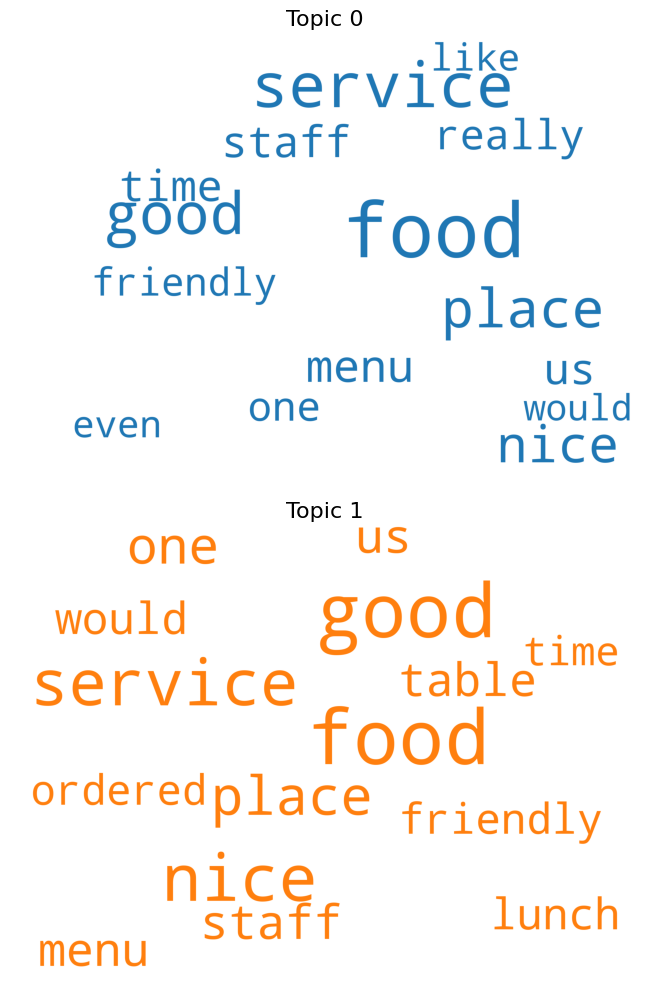

Figure 0: Topic modelling for file Dutch (negative)

Model perplexity: 23466.675889121638
-----------------------------------------------------------------------
Topic modelling for Dutch (positive).
Top-15 for topic #0: ['also', 'lunch', 'really', 'dinner', 'well', 'excellent', 'menu', 'staff', 'friendly', 'place', 'great', 'service', 'nice', 'food', 'good']
Top-15 for topic #1: ['also', 'delicious', 'lovely', 'one', 'dinner', 'lunch', 'nice', 'menu', 'place', 'service', 'staff', 'friendly', 'great', 'good', 'food']


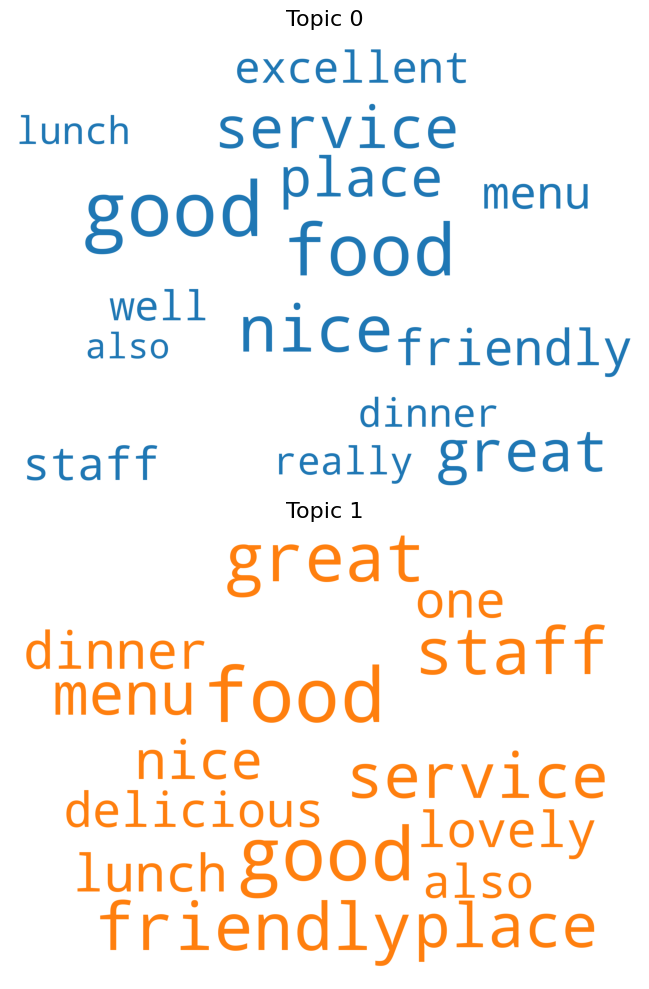

Figure 1: Topic modelling for file Dutch (positive)

Model perplexity: 31607.99705694763
-----------------------------------------------------------------------
Topic modelling for European (negative).
Top-15 for topic #0: ['people', 'ok', 'go', 'order', 'really', 'place', 'table', 'us', 'staff', 'one', 'friendly', 'service', 'nice', 'good', 'food']
Top-15 for topic #1: ['location', 'great', 'place', 'would', 'bad', 'menu', 'like', 'us', 'friendly', 'one', 'staff', 'nice', 'service', 'good', 'food']
Top-15 for topic #2: ['friendly', 'wine', 'us', 'back', 'like', 'table', 'people', 'dinner', 'time', 'menu', 'place', 'good', 'nice', 'service', 'food']
Top-15 for topic #3: ['people', 'went', 'lunch', 'bad', 'get', 'friendly', 'menu', 'nice', 'time', 'ok', 'us', 'place', 'service', 'good', 'food']
Top-15 for topic #4: ['would', 'ordered', 'time', 'one', 'staff', 'could', 'table', 'lunch', 'great', 'nice', 'really', 'place', 'good', 'service', 'food']
Top-15 for topic #5: ['dinner', 'also',

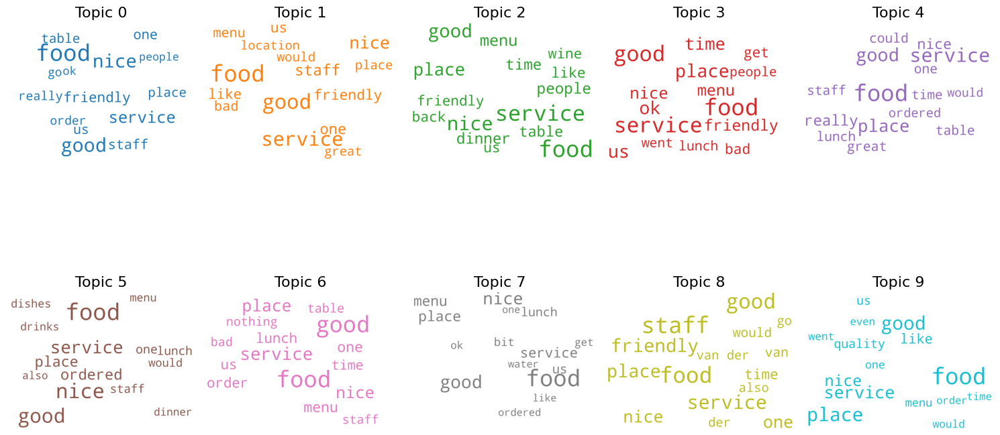

Figure 2: Topic modelling for file European (negative)

Model perplexity: 26468.8237729623
-----------------------------------------------------------------------
Topic modelling for European (positive).
Top-15 for topic #0: ['also', 'quality', 'atmosphere', 'well', 'lunch', 'staff', 'friendly', 'great', 'nice', 'excellent', 'place', 'menu', 'service', 'food', 'good']
Top-15 for topic #1: ['well', 'excellent', 'also', 'us', 'dinner', 'lunch', 'menu', 'place', 'nice', 'service', 'staff', 'friendly', 'great', 'food', 'good']
Top-15 for topic #2: ['excellent', 'delicious', 'one', 'well', 'menu', 'place', 'dinner', 'really', 'staff', 'great', 'friendly', 'service', 'nice', 'good', 'food']
Top-15 for topic #3: ['well', 'visit', 'would', 'lunch', 'also', 'excellent', 'really', 'staff', 'friendly', 'nice', 'place', 'service', 'great', 'food', 'good']
Top-15 for topic #4: ['back', 'delicious', 'friendly', 'dinner', 'staff', 'excellent', 'well', 'place', 'time', 'menu', 'service', 'great', 'foo

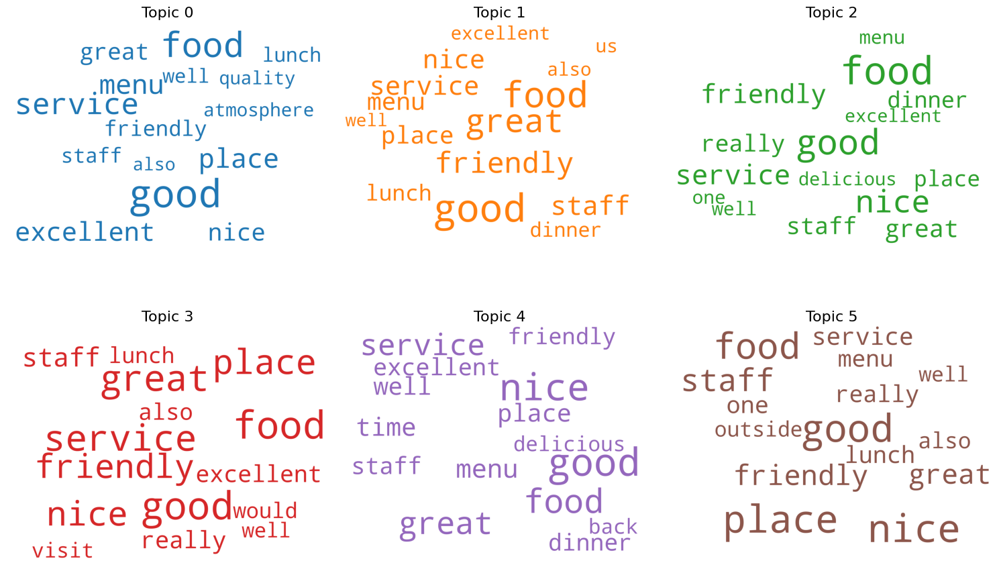

Figure 3: Topic modelling for file European (positive)

Model perplexity: 32861.65081154133
-----------------------------------------------------------------------
Topic modelling for Italian (negative).
Top-15 for topic #0: ['came', 'calamari', 'ok', 'never', 'great', 'nice', 'one', 'back', 'really', 'place', 'good', 'italian', 'service', 'pizza', 'food']
Top-15 for topic #1: ['nice', 'place', 'us', 'delivery', 'quality', 'pasta', 'ok', 'service', 'italian', 'food', 'one', 'ordered', 'order', 'pizza', 'good']
Top-15 for topic #2: ['service', 'nice', 'came', 'never', 'eat', 'waiter', 'minutes', 'would', 'asked', 'good', 'ordered', 'order', 'us', 'food', 'pizza']
Top-15 for topic #3: ['ok', 'quite', 'came', 'waiter', 'even', 'one', 'pasta', 'time', 'service', 'place', 'italian', 'nice', 'us', 'food', 'pizza']
Top-15 for topic #4: ['main', 'nothing', 'service', 'tasteless', 'many', 'people', 'friendly', 'however', 'place', 'food', 'nice', 'italian', 'pizzas', 'good', 'pizza']
Top-15 for 

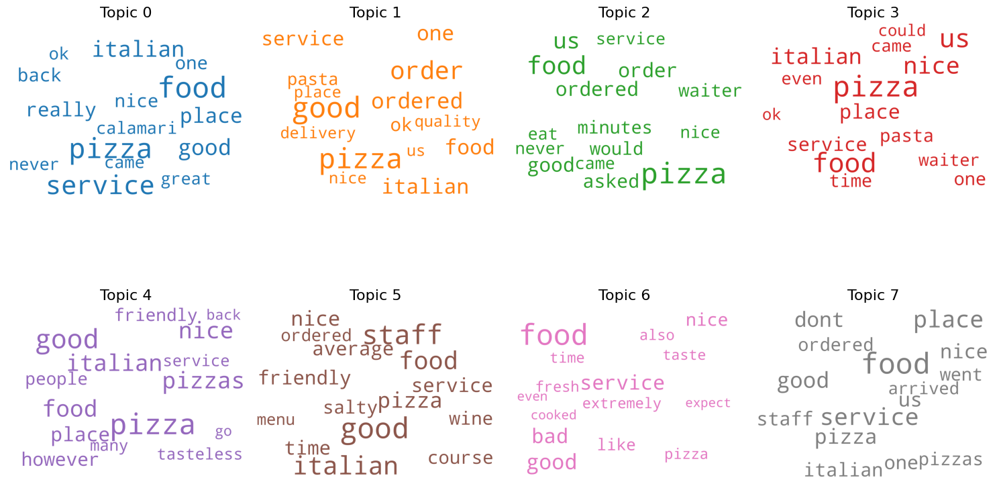

Figure 4: Topic modelling for file Italian (negative)

Model perplexity: 9090.372786995502
-----------------------------------------------------------------------
Topic modelling for Italian (positive).
Top-15 for topic #0: ['excellent', 'pasta', 'also', 'menu', 'delicious', 'staff', 'place', 'pizza', 'italian', 'friendly', 'nice', 'service', 'great', 'good', 'food']
Top-15 for topic #1: ['excellent', 'delicious', 'well', 'one', 'dinner', 'wine', 'great', 'pizza', 'friendly', 'service', 'place', 'nice', 'good', 'italian', 'food']
Top-15 for topic #2: ['dinner', 'excellent', 'time', 'well', 'pasta', 'always', 'pizzas', 'also', 'service', 'nice', 'food', 'friendly', 'italian', 'good', 'pizza']
Top-15 for topic #3: ['excellent', 'one', 'also', 'service', 'best', 'place', 'pizzas', 'great', 'friendly', 'staff', 'nice', 'good', 'food', 'pizza', 'italian']
Top-15 for topic #4: ['pasta', 'well', 'atmosphere', 'menu', 'staff', 'really', 'place', 'nice', 'friendly', 'pizza', 'service', 'italian

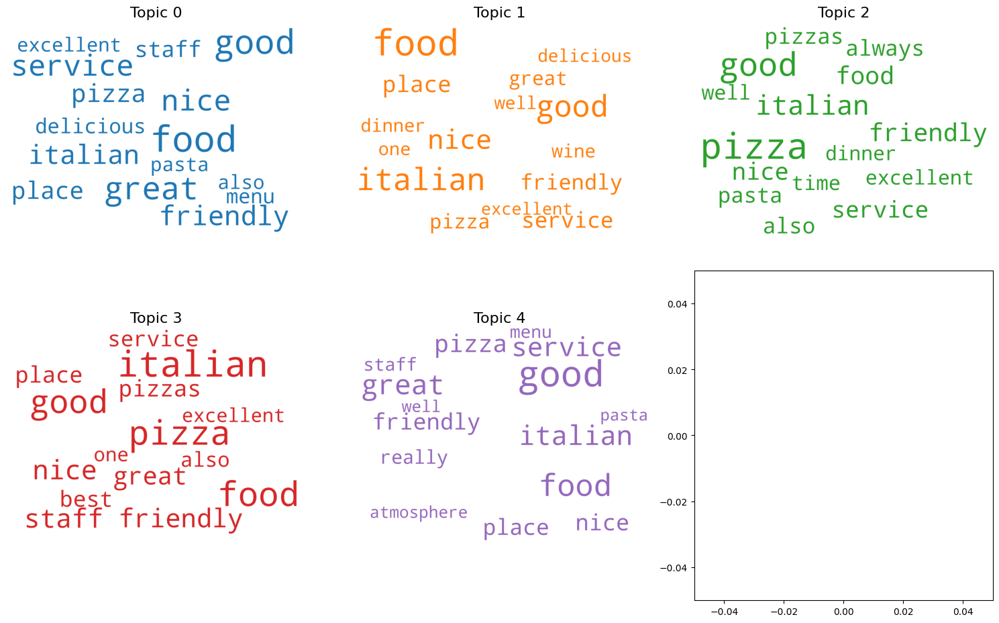

Figure 5: Topic modelling for file Italian (positive)

Model perplexity: 12714.518698416598
-----------------------------------------------------------------------
Topic modelling for Seafood (negative).
Top-15 for topic #0: ['came', 'even', 'could', 'staff', 'time', 'nice', 'table', 'would', 'place', 'one', 'menu', 'us', 'good', 'service', 'food']
Top-15 for topic #1: ['table', 'friendly', 'location', 'great', 'dinner', 'us', 'ok', 'one', 'place', 'staff', 'menu', 'nice', 'service', 'good', 'food']
Top-15 for topic #2: ['wine', 'bad', 'bit', 'us', 'really', 'staff', 'table', 'one', 'time', 'quality', 'nice', 'place', 'service', 'good', 'food']
Top-15 for topic #3: ['bad', 'well', 'ok', 'time', 'dinner', 'one', 'menu', 'friendly', 'staff', 'really', 'place', 'nice', 'service', 'good', 'food']


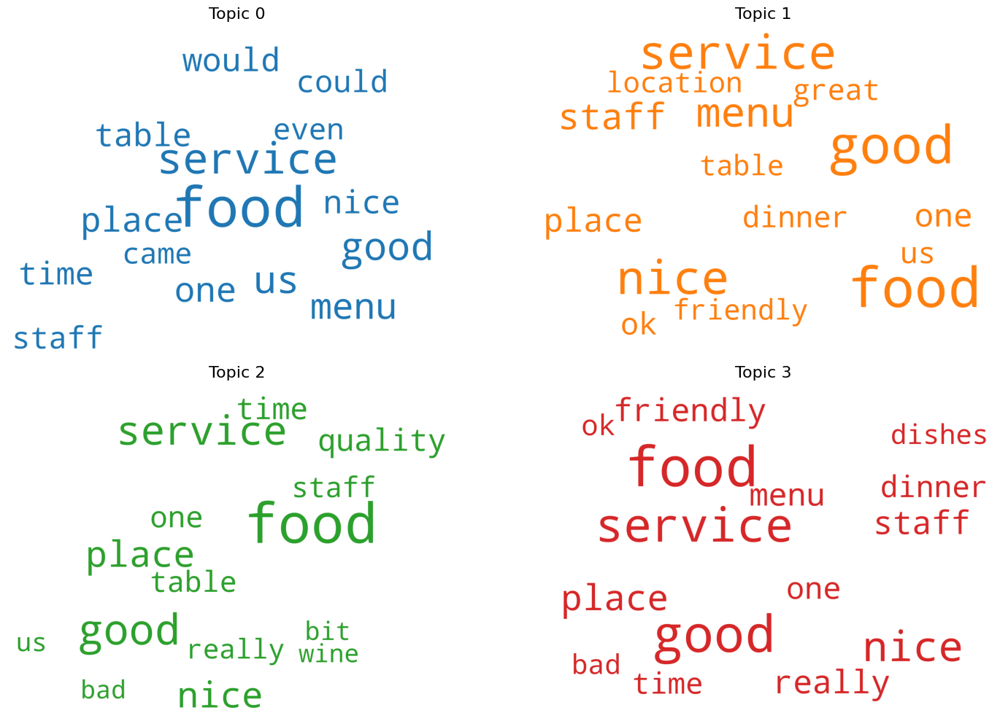

Figure 6: Topic modelling for file Seafood (negative)

Model perplexity: 22065.655877891175
-----------------------------------------------------------------------
Topic modelling for Seafood (positive).
Top-15 for topic #0: ['really', 'also', 'dishes', 'dinner', 'well', 'excellent', 'menu', 'staff', 'friendly', 'place', 'great', 'service', 'nice', 'food', 'good']
Top-15 for topic #1: ['lunch', 'delicious', 'really', 'wine', 'dinner', 'excellent', 'place', 'staff', 'friendly', 'menu', 'nice', 'great', 'service', 'good', 'food']


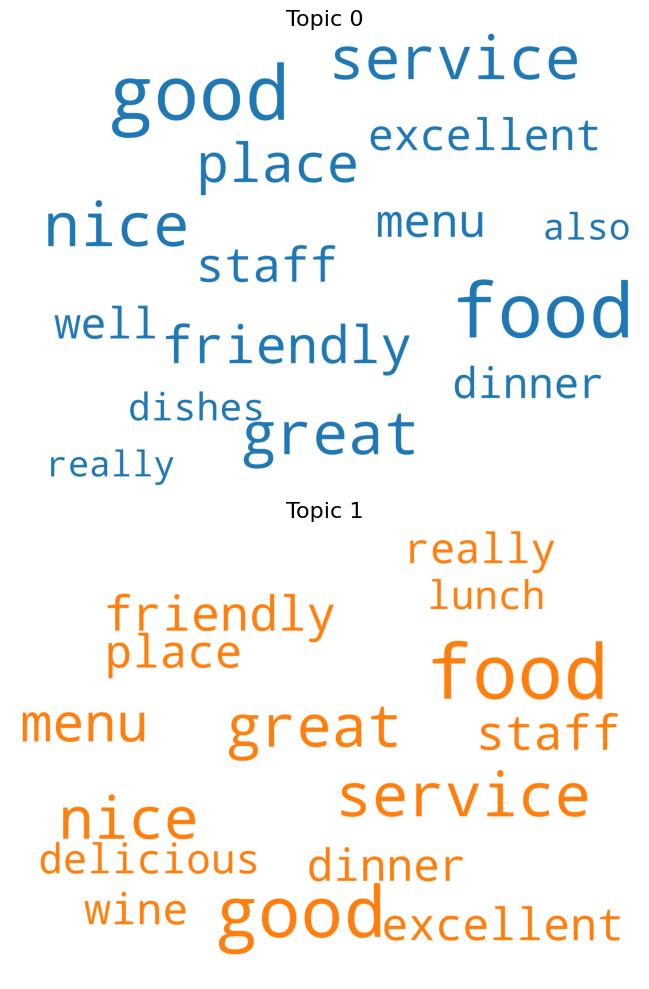

Figure 7: Topic modelling for file Seafood (positive)

Model perplexity: 29098.420722235187
-----------------------------------------------------------------------
Topic modelling for Vegetarian friendly (negative).
Top-15 for topic #0: ['bad', 'really', 'order', 'friendly', 'menu', 'one', 'staff', 'like', 'time', 'us', 'nice', 'place', 'service', 'good', 'food']
Top-15 for topic #1: ['great', 'quality', 'kids', 'dishes', 'time', 'one', 'went', 'friendly', 'menu', 'staff', 'nice', 'service', 'place', 'good', 'food']


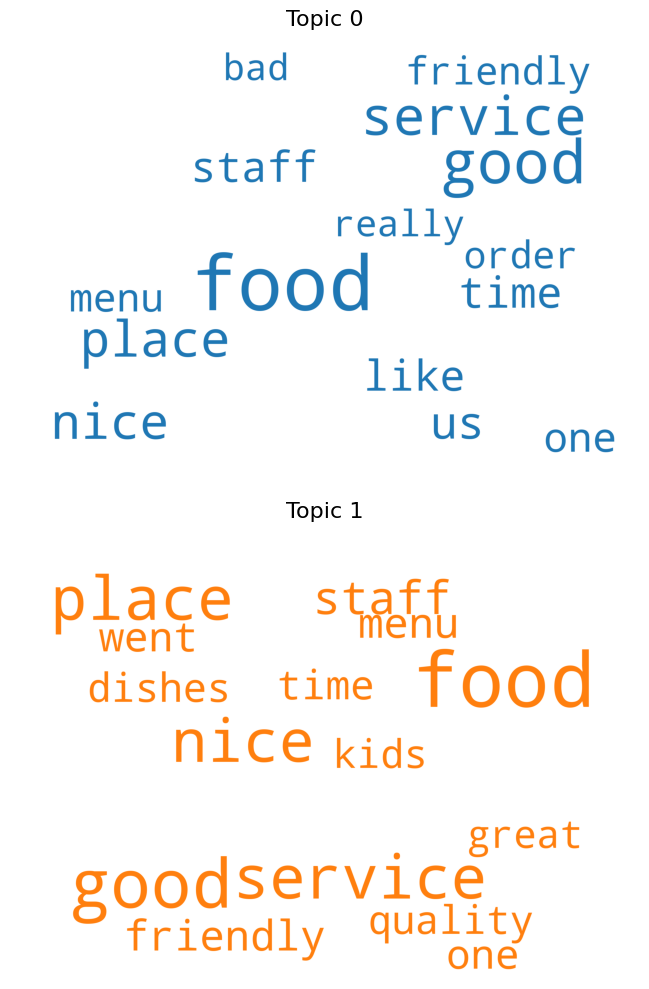

Figure 8: Topic modelling for file Vegetarian friendly (negative)

Model perplexity: 13580.25697225621
-----------------------------------------------------------------------
Topic modelling for Vegetarian friendly (positive).
Top-15 for topic #0: ['visit', 'also', 'lunch', 'dinner', 'menu', 'dishes', 'excellent', 'place', 'staff', 'great', 'nice', 'friendly', 'service', 'good', 'food']
Top-15 for topic #1: ['menu', 'one', 'excellent', 'coffee', 'also', 'tasty', 'time', 'staff', 'service', 'friendly', 'place', 'great', 'nice', 'food', 'good']
Top-15 for topic #2: ['excellent', 'time', 'lunch', 'also', 'menu', 'would', 'staff', 'service', 'friendly', 'great', 'really', 'nice', 'good', 'place', 'food']
Top-15 for topic #3: ['go', 'well', 'delicious', 'lunch', 'also', 'excellent', 'place', 'staff', 'menu', 'nice', 'friendly', 'good', 'service', 'great', 'food']
Top-15 for topic #4: ['excellent', 'also', 'lunch', 'back', 'one', 'well', 'nice', 'dishes', 'staff', 'place', 'great', 'friendly

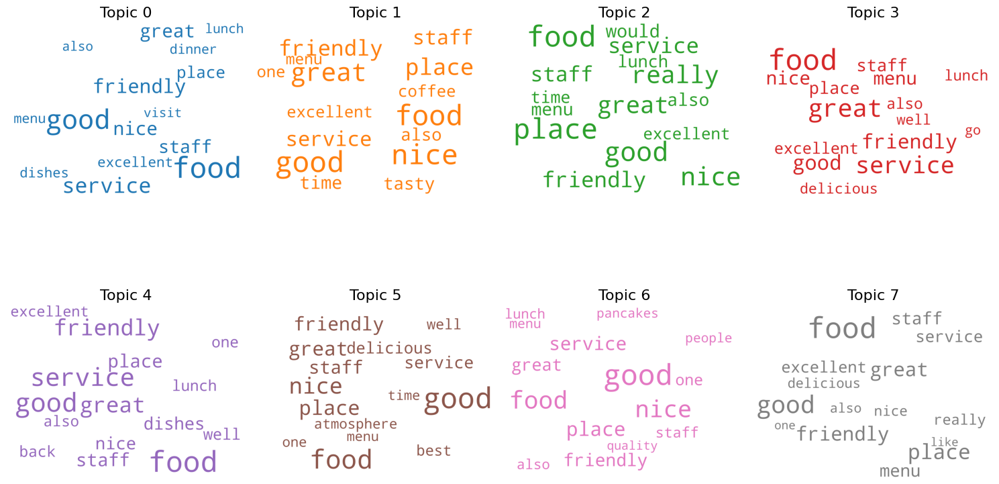

Figure 9: Topic modelling for file Vegetarian friendly (positive)

Model perplexity: 25537.53865808796
CPU times: total: 1min 40s
Wall time: 1min 45s


In [22]:
%%time

n_top_words_per_topic = 15

for i, file_path in enumerate(new_files):
    # Read reviews from file and normalise the corpus
    review_col_name = "Review"
    reviews_df = pd.read_csv(file_path, names=[review_col_name])
    normalize_corpus = np.vectorize(normalize_document)
    norm_corpus = normalize_corpus(reviews_df).flatten()

    # Transform corpus data into bag-of-words count matrix representation
    # Rows of the matrix represent the document, while columns are the vocabulary tokens
    cv = CountVectorizer(min_df=0., max_df=1., ngram_range = (1,2), stop_words=stop_words)
    cv_matrix = cv.fit_transform(norm_corpus)
    vocabulary = cv.get_feature_names_out()

    LDA_model = best_model_for_filepath[file_path]

    print(f"-----------------------------------------------------------------------\nTopic modelling for {filepath_to_string(file_path)}.")
    pyLDAvis.lda_model.prepare(LDA_model, cv_matrix, cv, mds='mmds')
    single_topic = LDA_model.components_[0]
    top_words = single_topic.argsort()[n_top_words_per_topic:]
    topics_dicts = []
    for index, topic in enumerate(LDA_model.components_):
        print(f'Top-{n_top_words_per_topic} for topic #{index}: {[cv.get_feature_names_out()[i] for i in topic.argsort()[-n_top_words_per_topic:]]}')
        topic_weights = [(token, np.round(weight, 2))
                         for token, weight in zip(vocabulary, topic)
                         ]  ## zip (word, importance_weight)
        topic_weights = sorted(topic_weights, key=lambda x: -x[1]) 
        word_weights = {}
        for weight in topic_weights:
            word_weights[weight[0]] = weight[1]
        topics_dicts.append(word_weights)
    topic_modelling_visualisation(n_top_words_per_topic, topics_dicts, file_path, i)
    print(f"Model perplexity: {LDA_model.perplexity(cv_matrix)}")

In [ ]:
new_files = glob.glob(f'./{folder_name}/*')
for file_path in enumerate(new_files):
    print(file_path)

-----------------------------------------------------------------------
Topic modelling for Dutch (negative).
Top-10 for topic #0: ['good', 'place', 'asked', 'one', 'service', 'restaurant', 'order', 'table', 'us', 'food']
Top-10 for topic #1: ['well', 'restaurant', 'also', 'staff', 'like', 'menu', 'service', 'good', 'food', 'place']
Top-10 for topic #2: ['menu', 'nice', 'place', 'staff', 'friendly', 'really', 'service', 'good', 'restaurant', 'food']
Top-10 for topic #3: ['course', 'quality', 'menu', 'coffee', 'time', 'service', 'nice', 'food', 'good', 'restaurant']
Top-10 for topic #4: ['time', 'restaurant', 'lunch', 'friendly', 'good', 'place', 'staff', 'service', 'nice', 'food']
Top-10 for topic #5: ['ok', 'one', 'bit', 'would', 'nice', 'like', 'good', 'service', 'restaurant', 'food']
Top-10 for topic #6: ['ok', 'friendly', 'dinner', 'lunch', 'place', 'service', 'restaurant', 'food', 'nice', 'good']


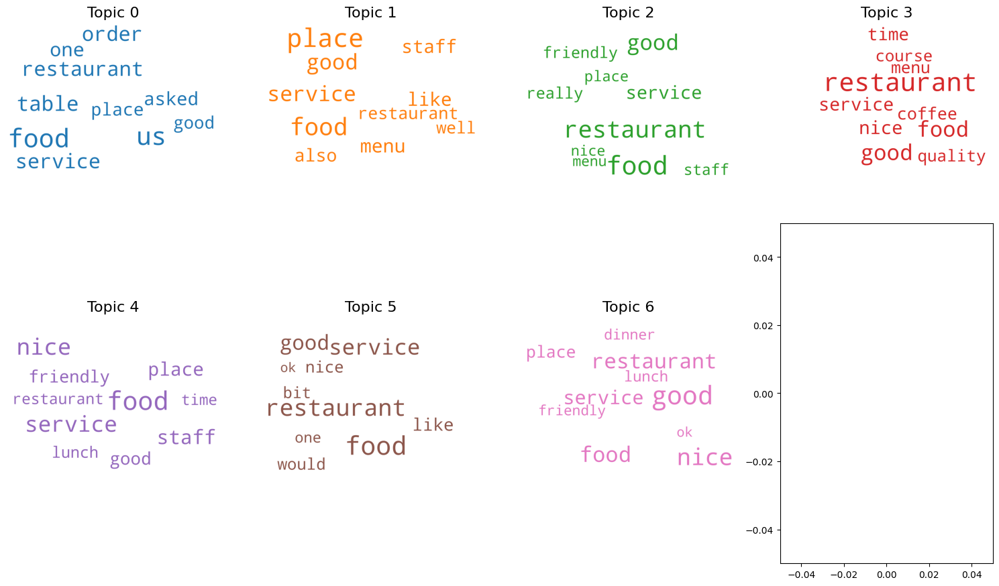

Figure 1: Topic modelling for file Dutch (negative)

Model perplexity: 2519.798269158807


In [73]:
%%time

n_top_words_per_topic = 10

for i, file_path in enumerate(new_files):
    # Read reviews from file and normalise the corpus
    review_col_name = "Review"
    reviews_df = pd.read_csv(file_path, names=[review_col_name])
    normalize_corpus = np.vectorize(normalize_document)
    norm_corpus = normalize_corpus(reviews_df).flatten()

    # Transform corpus data into bag-of-words count matrix representation
    # Rows of the matrix represent the document, while columns are the vocabulary tokens
    cv = CountVectorizer(min_df=0., max_df=1., ngram_range = (1,2), stop_words=stop_words)
    cv_matrix = cv.fit_transform(norm_corpus)
    vocabulary = cv.get_feature_names_out()

    LDA_model = best_model_for_filepath[file_path]

    print(f"-----------------------------------------------------------------------\nTopic modelling for {filepath_to_string(file_path)}.")
    pyLDAvis.lda_model.prepare(LDA_model, cv_matrix, cv, mds='mmds')
    single_topic = LDA_model.components_[0]
    top_10_words = single_topic.argsort()[-10:]
    topics_dicts = []
    for index, topic in enumerate(LDA_model.components_):
        print(f'Top-{n_top_words_per_topic} for topic #{index}: {[cv.get_feature_names_out()[i] for i in topic.argsort()[-n_top_words_per_topic:]]}')
        topic_weights = [(token, np.round(weight, 2))
                         for token, weight in zip(vocabulary, topic)
                         ]  ## zip (word, importance_weight)
        topic_weights = sorted(topic_weights, key=lambda x: -x[1]) 
        word_weights = {}
        for weight in topic_weights:
            word_weights[weight[0]] = weight[1]
        topics_dicts.append(word_weights)
    topic_modelling_visualisation(topics_dicts, file_path, i)
    print(f"Model perplexity: {LDA_model.perplexity(cv_matrix)}")